# Load CSV and EDA

In [1]:
import pandas as pd

In [2]:
df = pd.read_csv('property_sales_canberra.csv')

In [3]:
df.head()

,datesold,price,suburb,postcode,lat,lon,parking,bathrooms,bedrooms,propertyType,suburbid
0,9/06/2000,223000.0,Nicholls,2913,NaN,NaN,2,2.0,4,house,ACT708
1,1/01/2001,350000.0,Ngunnawal,2913,NaN,NaN,1,NaN,3,house,ACT706
2,11/12/2003,550000.0,Weston,2611,NaN,NaN,2,NaN,4,house,ACT441
3,21/09/2005,276000.0,Isabella Plains,2905,NaN,NaN,1,1.0,3,house,ACT612
4,1/11/2005,400000.0,Conder,2906,NaN,NaN,2,NaN,5,house,ACT613


In [4]:
df.shape

(43178, 11)

In [5]:
df.describe()

,price,postcode,lat,lon,parking,bathrooms,bedrooms
count,4.243500e+04,43178.000000,42033.000000,42033.000000,43178.000000,42499.000000,43178.000000
mean,6.037398e+05,2728.855644,-35.293447,149.096122,1.760017,1.643403,3.193501
std,3.139764e+05,146.564444,0.091796,0.040526,0.937361,0.644463,0.990638
min,5.000000e+04,2092.000000,-35.509975,148.921424,0.000000,1.000000,0.000000
25%,4.300000e+05,2607.000000,-35.363857,149.067390,1.000000,1.000000,3.000000
50%,5.390000e+05,2615.000000,-35.270536,149.099522,2.000000,2.000000,3.000000
75%,6.760000e+05,2905.000000,-35.212323,149.130708,2.000000,2.000000,4.000000
max,8.000000e+06,2914.000000,-35.138572,149.250290,31.000000,21.000000,14.000000


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43178 entries, 0 to 43177
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   datesold      43178 non-null  object 
 1   price         42435 non-null  float64
 2   suburb        43178 non-null  object 
 3   postcode      43178 non-null  int64  
 4   lat           42033 non-null  float64
 5   lon           42033 non-null  float64
 6   parking       43178 non-null  int64  
 7   bathrooms     42499 non-null  float64
 8   bedrooms      43178 non-null  int64  
 9   propertyType  43178 non-null  object 
 10  suburbid      43178 non-null  object 
dtypes: float64(4), int64(3), object(4)
memory usage: 3.6+ MB


In [7]:
df.isnull().sum()

datesold           0
price            743
suburb             0
postcode           0
lat             1145
lon             1145
parking            0
bathrooms        679
bedrooms           0
propertyType       0
suburbid           0
dtype: int64

In [8]:
df[df.duplicated()]

,datesold,price,suburb,postcode,lat,lon,parking,bathrooms,bedrooms,propertyType,suburbid
20745,2/03/2016,630000.0,Moncrieff,2914,NaN,NaN,2,NaN,4,house,ACT932
25137,2/03/2017,385000.0,Chisholm,2905,-35.427042,149.117373,1,1.0,3,house,ACT609
29292,8/01/2018,875000.0,Calwell,2905,-35.444985,149.099545,2,3.0,5,house,ACT611
38512,7/02/2015,360000.0,Torrens,2607,-35.373889,149.087976,1,1.0,1,unit,ACT332
40057,23/01/2017,720000.0,Kingston,2604,-35.317160,149.143377,2,2.0,3,unit,ACT217
42411,11/12/2018,320000.0,Gungahlin,2912,-35.181563,149.130712,1,1.0,2,unit,ACT710
42478,15/01/2019,309950.0,Gungahlin,2912,-35.181563,149.130712,1,1.0,2,unit,ACT710
42958,12/07/2019,339950.0,Gungahlin,2912,-35.182384,149.131132,1,1.0,2,unit,ACT710


# Data cleaning and preprocessing

In [9]:
# delete null and duplicate rows

df = df.drop_duplicates()
print(df.shape)

df = df.dropna()
print(df.shape)

(43170, 11)
(41116, 11)


In [10]:
df.isnull().sum()

datesold        0
price           0
suburb          0
postcode        0
lat             0
lon             0
parking         0
bathrooms       0
bedrooms        0
propertyType    0
suburbid        0
dtype: int64

In [11]:
df[df.duplicated()]

,datesold,price,suburb,postcode,lat,lon,parking,bathrooms,bedrooms,propertyType,suburbid


# Data visualization

<AxesSubplot:>

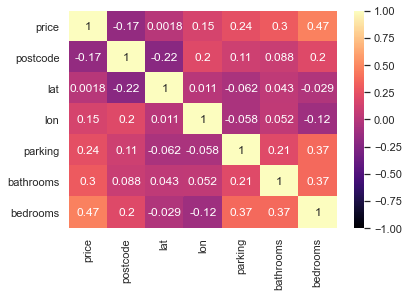

In [12]:
# check correlation between columns to decide on features

import matplotlib.pyplot as plt 
import seaborn as sns
sns.set();

corr = df.corr()

sns.heatmap(corr, vmin=-1, vmax=1, annot=True, cmap='magma')

Text(0, 0.5, 'Frequency')

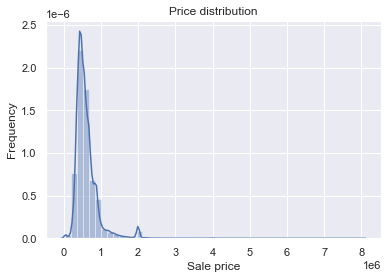

In [13]:
# distribution plot

sns.distplot(df['price'])
plt.title('Price distribution')
plt.xlabel('Sale price')
plt.ylabel('Frequency')

<function seaborn.utils.despine(fig=None, ax=None, top=True, right=True, left=False, bottom=False, offset=None, trim=False)>

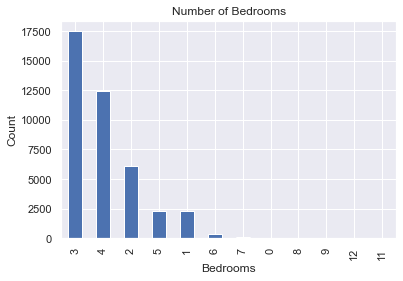

In [14]:
df['bedrooms'].value_counts().plot(kind='bar')
plt.title('Number of Bedrooms')
plt.xlabel('Bedrooms')
plt.ylabel('Count')
sns.despine

<function seaborn.utils.despine(fig=None, ax=None, top=True, right=True, left=False, bottom=False, offset=None, trim=False)>

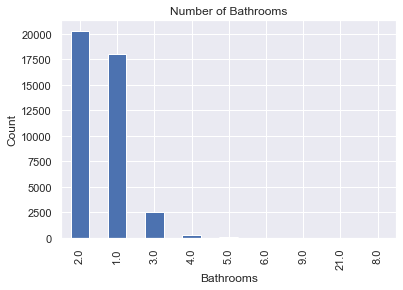

In [15]:
df['bathrooms'].value_counts().plot(kind='bar')
plt.title('Number of Bathrooms')
plt.xlabel('Bathrooms')
plt.ylabel('Count')
sns.despine

<function seaborn.utils.despine(fig=None, ax=None, top=True, right=True, left=False, bottom=False, offset=None, trim=False)>

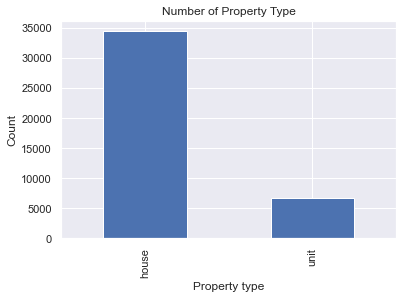

In [16]:
df['propertyType'].value_counts().plot(kind='bar')
plt.title('Number of Property Type')
plt.xlabel('Property type')
plt.ylabel('Count')
sns.despine

Text(0.5, 1.0, 'Price vs Property Type')

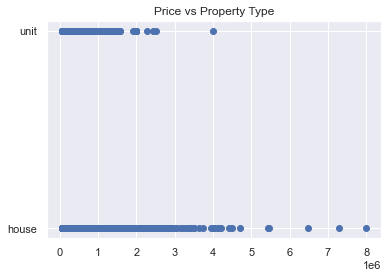

In [17]:
plt.scatter(df['price'], df['propertyType'])
plt.title('Price vs Property Type')

Text(0.5, 1.0, 'Price vs Suburbs')

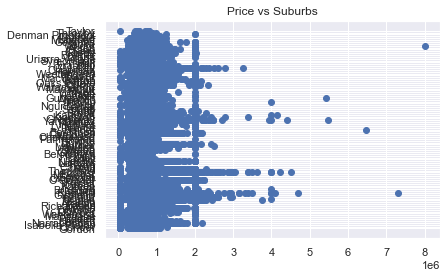

In [18]:
plt.scatter(df['price'], df['suburb'])
plt.title('Price vs Suburbs')

# Feature engineering

In [19]:
# remove lat, lon and suburb to avoid redundancy with postcode, suburbid and datesold not relevant
y = df['price']
X = df[['bedrooms', 'bathrooms', 'parking', 'postcode', 'propertyType']]

In [20]:
y.head()

37    350000.0
42    450000.0
44    250000.0
45    350000.0
46    290000.0
Name: price, dtype: float64

In [21]:
X.head()

,bedrooms,bathrooms,parking,postcode,propertyType
37,3,2.0,1,2906,house
42,3,2.0,2,2906,house
44,3,1.0,1,2905,house
45,3,2.0,1,2906,house
46,3,1.0,1,2906,house


In [22]:
# do label encoding for propertyType

from sklearn.preprocessing import LabelEncoder

lbl = LabelEncoder()
X['propertyType'] = lbl.fit_transform(X['propertyType'])

In [23]:
X['propertyType'].value_counts()

0    34470
1     6646
Name: propertyType, dtype: int64

In [24]:
X.head()

,bedrooms,bathrooms,parking,postcode,propertyType
37,3,2.0,1,2906,0
42,3,2.0,2,2906,0
44,3,1.0,1,2905,0
45,3,2.0,1,2906,0
46,3,1.0,1,2906,0


In [25]:
# use PCA to evaluate number of features
# ref: https://www.kaggle.com/ankitjha/comparing-regression-models

import numpy as np
from sklearn.preprocessing import StandardScaler

X_all = X.values
X_all = np.asarray(X_all)
X_std = StandardScaler().fit_transform(X_all)

Text(0, 0.5, 'Cumulative explained variance')

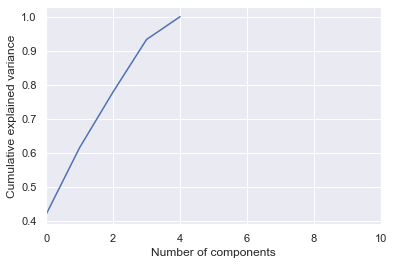

In [26]:
from sklearn.decomposition import PCA

pca = PCA().fit(X_std)

plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlim(0, 10, 1)
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

## Note: four components would be enough to explain 100% of the variance. feature should be 4.

In [27]:
sklearn_pca = PCA(n_components=4)
X_train_pca = sklearn_pca.fit_transform(X_std)
X_train_pca.shape

(41116, 4)

# Create model, train and eval

Ref: https://towardsdatascience.com/create-a-model-to-predict-house-prices-using-python-d34fe8fad88f

In [28]:
# linear regression

from sklearn.linear_model import LinearRegression

reg = LinearRegression()

In [29]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [30]:
reg.fit(X_train, y_train)

LinearRegression()

In [34]:
# mean squared error

y_pred = reg.predict(X_test)
mse = np.mean((y_pred - y_test) ** 2)
print(y_pred)
print(mse)

[444597.48483642 294281.88836914 672497.14943016 ... 826265.82301365
 297315.77910655 760325.13062605]
66463338221.47566


In [31]:
reg.score(X_test, y_test)

0.3100648458853339

# Test set evaluation

In [32]:
# Gradient Boosting Regressor

from sklearn.ensemble import GradientBoostingRegressor

est = GradientBoostingRegressor(n_estimators=400, max_depth=5)
est.fit(X_train, y_train)

GradientBoostingRegressor(max_depth=5, n_estimators=400)

In [33]:
est.score(X_test, y_test)

0.5822059725376536